# Image2Image Translation with CycleGAN

## Import Libraries, Load Cycle2Monet, and Data

In [13]:
from glob import glob
import shutil
import urllib.request
import zipfile
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pytorch_fid import fid_score
from skimage.io import imread
import torch
from torch import nn
import torchvision.transforms as T
import torchvision.models as models
import pandas as pd

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.metrics import structural_similarity
import clip
from sklearn.metrics.pairwise import cosine_similarity

In [1]:
# Clone the repository and nanvigate into the directory
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix
%cd pytorch-CycleGAN-and-pix2pix

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2619, done.
remote: Total 2619 (delta 0), reused 0 (delta 0), pack-reused 2619 (from 1)
Receiving objects: 100% (2619/2619), 8.24 MiB | 4.10 MiB/s, done.
Resolving deltas: 100% (1654/1654), done.
/Users/sebastianuedingslohmann/Desktop/CV_Project/Advanced-Machine-Learning-for-Computer-Vision/pytorch-CycleGAN-and-pix2pix


In [6]:
# Create directory
os.makedirs("checkpoints/monet2photo_pretrained", exist_ok=True)

# Download pretrained model
urllib.request.urlretrieve(
    "http://efrosgans.eecs.berkeley.edu/cyclegan/pretrained_models/monet2photo.pth",
    "checkpoints/monet2photo_pretrained/latest_net_G.pth")

('checkpoints/monet2photo_pretrained/latest_net_G.pth',
 <http.client.HTTPMessage at 0x1432fdf10>)

In [7]:
# Download Monet2Photo
os.makedirs("datasets", exist_ok=True)
urllib.request.urlretrieve(
    "http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/monet2photo.zip",
    "datasets/monet2photo.zip")

with zipfile.ZipFile("datasets/monet2photo.zip", 'r') as zip_ref:
    zip_ref.extractall("datasets/")
os.remove("datasets/monet2photo.zip")

In [8]:
# Same for Cezanne2Photo
urllib.request.urlretrieve(
    "http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/cezanne2photo.zip",
    "datasets/cezanne2photo.zip")

with zipfile.ZipFile("datasets/cezanne2photo.zip", 'r') as zip_ref:
    zip_ref.extractall("datasets/")
os.remove("datasets/cezanne2photo.zip")

In [9]:
def count_images(path):
    return len([
        f for f in os.listdir(path)
        if f.lower().endswith((".jpg", ".png", ".jpeg"))])

In [10]:
def dataset_stats(base_path):
    return {
        "Train paintings": count_images(os.path.join(base_path, "trainA")),
        "Train real images": count_images(os.path.join(base_path, "trainB")),
        "Test paintings": count_images(os.path.join(base_path, "testA")),
        "Test real images": count_images(os.path.join(base_path, "testB")),}

In [11]:
monet_stats = dataset_stats("datasets/monet2photo")
cezanne_stats = dataset_stats("datasets/cezanne2photo")

In [16]:
df_counts = pd.DataFrame.from_dict(
    {"Monet": monet_stats, "Cezanne": cezanne_stats}, orient="index")

display(df_counts)

,Train paintings,Train real images,Test paintings,Test real images
Monet,1072,6287,121,751
Cezanne,525,6287,58,751


## Exploratory Data Analysis

In [17]:
# Path to the directory containing Monet training images
monet_train_images_path = "datasets/monet2photo/trainA" 
photo_images_path = "datasets/monet2photo/trainB"
cezanne_train_images_path = "datasets/cezanne2photo/trainA"
monet_test_images_path = "datasets/monet2photo/testA"

# Function to list first n image files in a folder
def list_first_n_images(folder, n=100):
    files = [f for f in os.listdir(folder) if f.lower().endswith((".png", ".jpg", ".jpeg"))]
    files.sort()
    return files[:n]

# Function to display first 100 images in a folder
def show_first_100(folder, title, resize_to=(64, 64)):
    image_files = list_first_n_images(folder, n=100)

    fig, axes = plt.subplots(10, 10, figsize=(15, 15))
    fig.suptitle(title, fontsize=16)

    for i, ax in enumerate(axes.flat):
        ax.axis("off")
        if i < len(image_files):
            img_path = os.path.join(folder, image_files[i])
            try:
                img = Image.open(img_path).convert("RGB").resize(resize_to)
                ax.imshow(img)
            except Exception:
                ax.text(0.5, 0.5, "ERR", ha="center", va="center", fontsize=10)

    plt.tight_layout()
    plt.show()

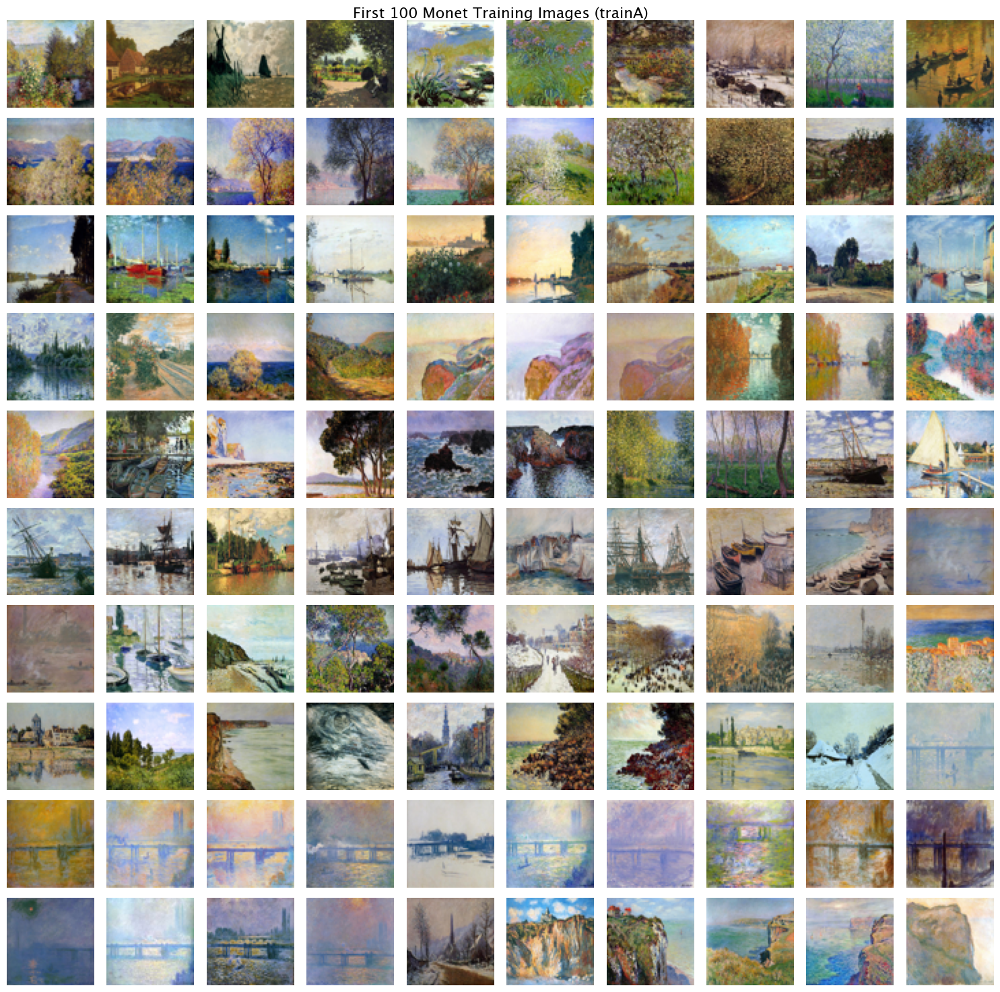

In [18]:
show_first_100(monet_train_images_path, "First 100 Monet Training Images (trainA)")

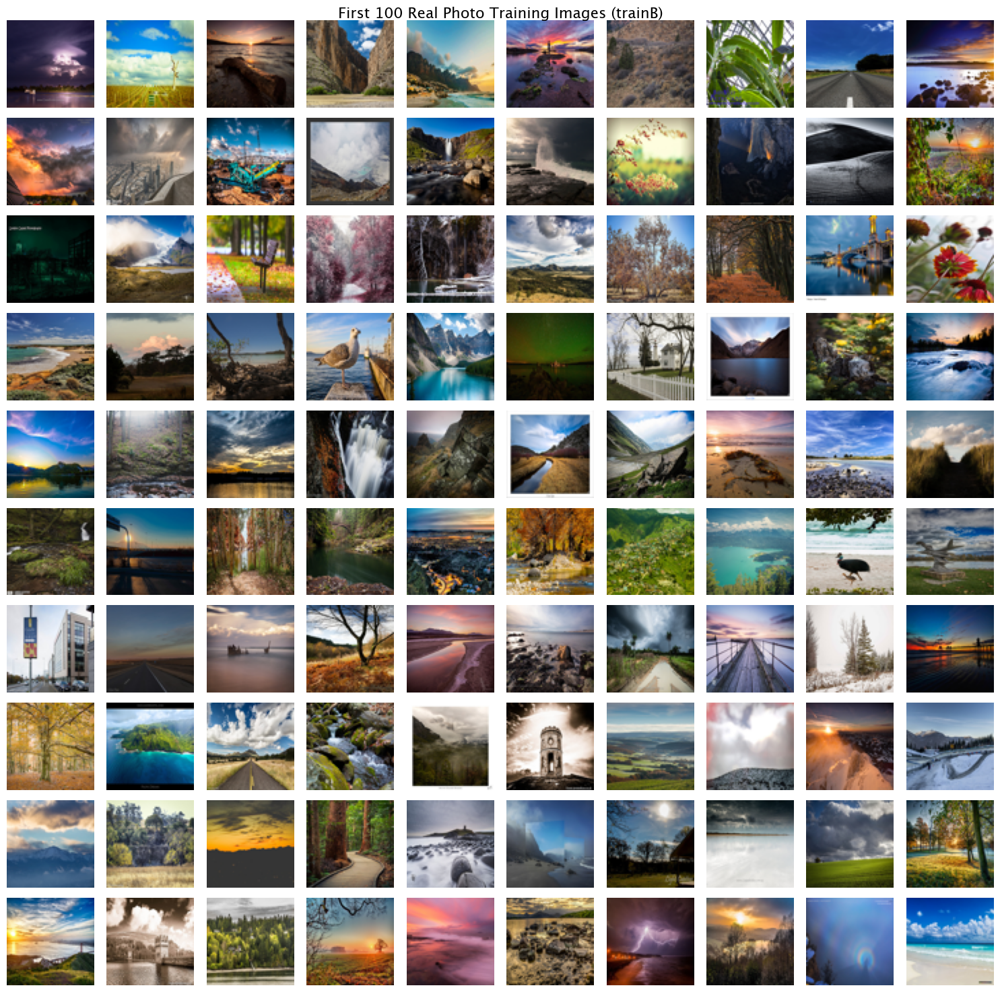

In [19]:
show_first_100(photo_images_path, "First 100 Real Photo Training Images (trainB)")

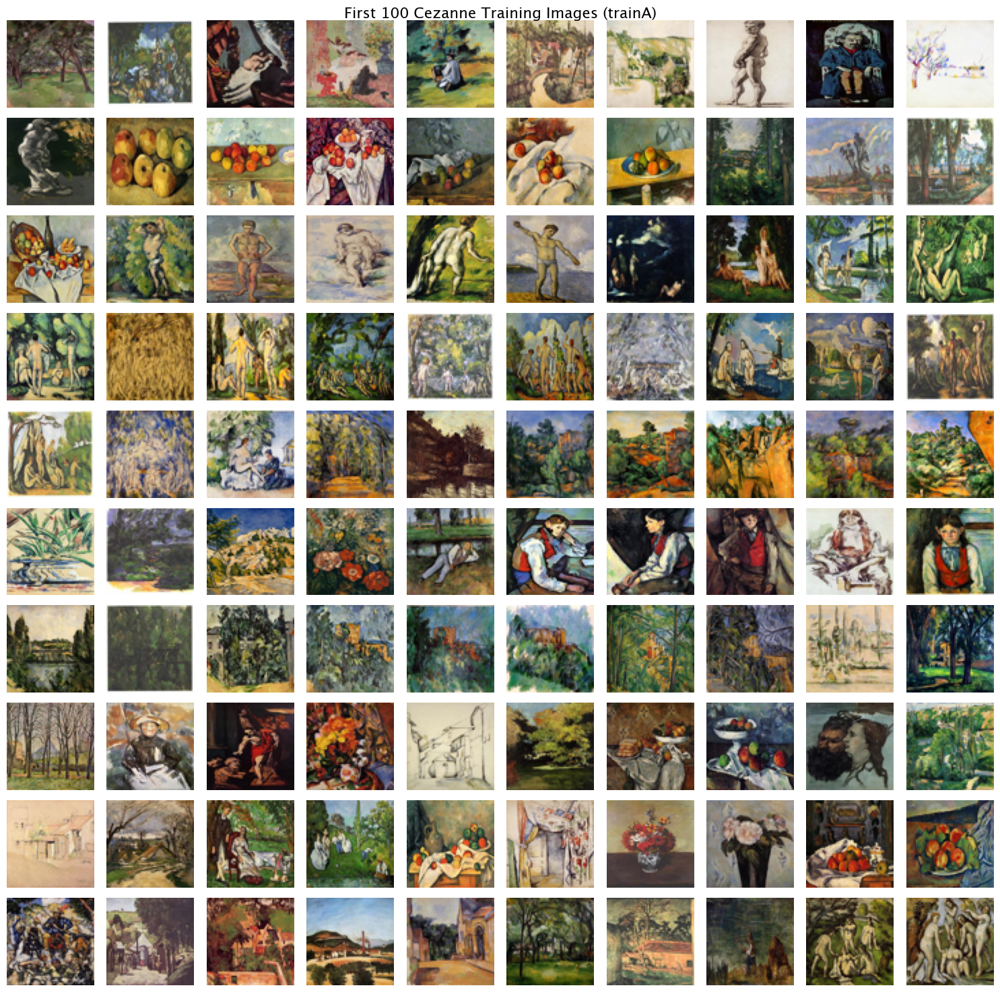

In [20]:
show_first_100(cezanne_train_images_path, "First 100 Cezanne Training Images (trainA)")